# Predicción de precio de oferta de vivienda

La base de datos contiene información sobre ofertas inmobiliarias con variables de la propiedad, variables de las zona, y algunas variables de cercanias a colegios y farmacias. 
 
 Metadata:

* ID_LOCALIDAD:   ID de la división administrativa LOCALIDAD
* ID_DISTRITO:    ID de la división administrativa DISTRITO
* ID_COMUNA:      ID de la división administrativa COMUNA
* lat:            Latitud
* lng:            Longitud
* precio_f:       Precio de oferta de la propiedad
* region:         Región donde se encuentra la propiedad
* tipo:           Tipo de propiedad
* direccion:      Dirección
* descripcion:    Descripción
* sup_total:      Superficie Total
* sup_util:       Superficie Útil
* dormitorios:    Dormitorios
* banos:          Baños
* antiguedad:     Antigüedad
* bodegas:        Bodegas
* min_dist_col:   Distancia mínima a un colegio
* n_col:          Número de colegios a 1 kilometro
* mean_dist_col:  Distancia promedio a los colegios cercanos
* min_dist_farm:  Distancia mínima a una farmacia
* n_farm:         Número de farmacias a 1 kilometro
* mean_dist_farm: Distancia promedio a farmacias cercanas
* RH_PERLLEG4:    % de personas en la zona de la propiedad que si nació en otro país, llegó antes de 1990 
* CNV_MONPAGVIVP: Promedio Monto de pago por concepto de arriendo o dividendo en la zona de la propiedad 
* CNH_INGTOTP:    Promedio del ingreso total del hogar corregido en la zona de la propiedad
* CNRH_INGOCUP:   Promedio del ingreso ocupación principal

El objetivo final será predecir el precio de oferta de la propiedad a partir de el resto de las variables seleccionadas.


## 1. Lectura e inspección de base

Lectura del archivo y verificación de la cantidad de registros, variables y el formato de estas.

In [52]:
# Librerias básicas

import numpy as np 
import pandas as pd 
from scipy import stats
from scipy.stats import norm, skew #for some statistics

# Librerias de visualización

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import scipy as sp

# Librerias de modelos

from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.metrics import mean_squared_error, make_scorer, max_error
from sklearn import preprocessing, svm
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor


In [2]:
df = pd.read_csv('C:/Users/camil/base_prueba.csv', sep = ';')

In [3]:
# A DESTACAR

# 1. El número de registros totales es de 37.768
# 2. Existen 26 variables en el set de datos
# 3. De los cuales 22 son de tipo númerico (entero y decimal), y 4 son categóricas.

def Explore(df):
        print('DataFrame Shape : \n')
        display(df.shape)
        print('DataFrame examples : \n')
        display(df.head())
        print("information about Dataset")
        display(df.info())
        print('DataFrame Description : \n')
        display(df.describe())
        
Explore(df)

DataFrame Shape : 



(37768, 26)

DataFrame examples : 



,ID_LOCALIDAD,ID_DISTRITO,ID_COMUNA,lat,lng,precio_f,region,tipo,direccion,descripcion,...,min_dist_col,n_col,mean_dist_col,min_dist_farm,n_farm,mean_dist_farm,RH_PERLLEG4,CNV_MONPAGVIVP,CNH_INGTOTP,CNRH_INGOCUP
0,6101011001,610101,6101,6.217611e+06,339568.959064,410000000.0,bernardo-ohiggins,casa,San Ramon,Nieny Vende hermosa parcela de 5 000 mts2 ...,...,89.873939,10,525.003210,112.960689,10,409.401279,0.002729,182798.16,1025098.46,588102.78
1,6101011001,610101,6101,6.217611e+06,339569.178969,186657380.0,bernardo-ohiggins,casa,El Olivar 1 Casa 2,Estupenda casa con lindo jard n piscina ...,...,90.242446,10,525.044718,113.333612,10,409.654368,0.002729,182798.16,1025098.46,588102.78
2,6101031001,610103,6101,6.217980e+06,338698.268899,35000000.0,bernardo-ohiggins,casa,Altazor 01620,Casa de dos pisos con muy buenas ampliacio...,...,621.683357,5,771.829938,112.930782,10,575.718592,0.004479,158218.36,759789.81,373339.76
3,6101031001,610103,6101,6.217980e+06,338698.268899,55000000.0,bernardo-ohiggins,casa,El Arado 1518,EXCELENTE OPORTUNIDAD DE INVERSI NHermosa p...,...,621.683357,5,771.829938,112.930782,10,575.718592,0.004479,158218.36,759789.81,373339.76
4,6101031001,610103,6101,6.218012e+06,338689.990298,272806940.0,bernardo-ohiggins,casa,Calle Uni n Obrera Campos,Estupenda casa construcci n completamente ...,...,632.800837,5,787.188282,114.359442,10,619.686775,0.004479,158218.36,759789.81,373339.76


information about Dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37768 entries, 0 to 37767
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ID_LOCALIDAD    37768 non-null  int64  
 1   ID_DISTRITO     37768 non-null  int64  
 2   ID_COMUNA       37768 non-null  int64  
 3   lat             37768 non-null  float64
 4   lng             37768 non-null  float64
 5   precio_f        37768 non-null  float64
 6   region          37768 non-null  object 
 7   tipo            37768 non-null  object 
 8   direccion       37734 non-null  object 
 9   descripcion     37672 non-null  object 
 10  sup_total       37768 non-null  float64
 11  sup_util        37600 non-null  float64
 12  dormitorios     37617 non-null  float64
 13  banos           37514 non-null  float64
 14  antiguedad      1149 non-null   float64
 15  bodegas         1441 non-null   float64
 16  min_dist_col    37768 non-null  float64
 17  n_col

None

DataFrame Description : 



,ID_LOCALIDAD,ID_DISTRITO,ID_COMUNA,lat,lng,precio_f,sup_total,sup_util,dormitorios,banos,...,min_dist_col,n_col,mean_dist_col,min_dist_farm,n_farm,mean_dist_farm,RH_PERLLEG4,CNV_MONPAGVIVP,CNH_INGTOTP,CNRH_INGOCUP
count,3.776800e+04,3.776800e+04,37768.000000,3.776800e+04,37768.000000,3.776800e+04,3.776800e+04,37600.000000,37617.000000,37514.000000,...,3.776800e+04,37768.000000,31558.000000,3.776800e+04,37768.000000,28930.000000,37768.000000,37709.000000,3.776800e+04,3.776800e+04
mean,1.295620e+10,1.295620e+06,12956.140966,6.296375e+06,348566.699361,2.158073e+08,7.746193e+02,141.728165,3.162427,2.404542,...,inf,3.997776,658.107877,inf,3.730513,621.923345,0.009781,373860.761401,2.455142e+06,1.070170e+06
std,1.166083e+09,1.166083e+05,1166.081859,1.811605e+04,11644.733265,1.171165e+08,2.569025e+04,1603.640995,1.263923,1.046600,...,NaN,3.160350,149.819823,NaN,3.432856,186.920188,0.007823,164743.002914,1.250084e+06,5.224544e+05
min,6.101011e+09,6.101010e+05,6101.000000,6.147199e+06,221637.771882,1.000000e+00,5.000000e+00,1.000000,1.000000,0.000000,...,2.977668e-01,0.000000,0.297767,0.000000e+00,0.000000,0.018524,0.000000,25000.000000,3.941219e+05,2.463333e+05
25%,1.311305e+10,1.311305e+06,13113.000000,6.294421e+06,345844.422543,1.089594e+08,8.000000e+01,70.000000,2.000000,2.000000,...,2.747193e+02,1.000000,571.428371,2.839584e+02,1.000000,502.602102,0.003019,246710.930000,1.370530e+06,6.080633e+05
50%,1.311914e+10,1.311914e+06,13119.000000,6.299105e+06,351058.535110,2.004413e+08,1.420000e+02,108.000000,3.000000,2.000000,...,4.582979e+02,4.000000,665.397137,5.243017e+02,3.000000,634.121470,0.007989,368495.050000,2.235446e+06,9.746143e+05
75%,1.313004e+10,1.313004e+06,13130.000000,6.303251e+06,354512.546115,3.144459e+08,2.850000e+02,145.000000,4.000000,3.000000,...,7.737677e+02,6.000000,755.444261,9.513977e+02,6.000000,756.700698,0.014362,483003.970000,3.302374e+06,1.455485e+06
max,1.360503e+10,1.360503e+06,13605.000000,6.351016e+06,406736.534124,4.494135e+08,4.000000e+06,200000.000000,14.000000,10.000000,...,inf,10.000000,999.933507,inf,10.000000,999.970419,0.047619,908153.240000,6.880593e+06,2.453007e+06


## 2. Análisis descriptivo

Realizar el análisis descriptivo que estimen pertinente de acuerdo al problema descrito. Este debe ayudarles a tomar algunas decisiones sobre que variables servirán, cuales hay que transformar, registros a omitir, etc. Jumbitos extra a visualizaciones útiles e interesantes.

In [4]:
# A DESTACAR

# 1. Se detectaron valores infinitos en las variables min_dist_col y min_dist_farm, estos se reemplazan por valores nulos
#    que serán tratados más adelante.

df.replace([np.inf, -np.inf], np.nan, inplace=True)

IndexError: index 0 is out of bounds for axis 0 with size 0

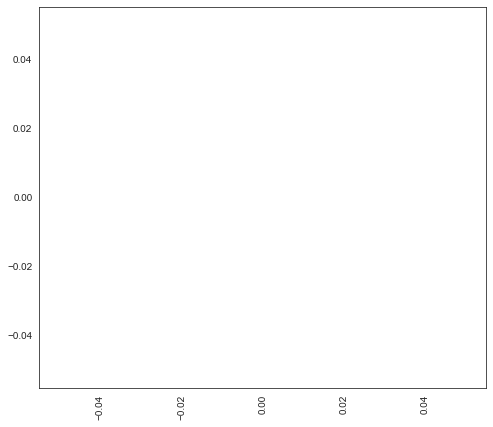

In [22]:
# A DESTACAR

# 1. Existen 12 variables con nulos, de las cuales 2 sobrepasan el 30 % de valores perdidos.
# 2. No se tendrán en cuenta las variables de identificación ni las variables con mayor proporción de nulos.

sns.set_style("white")
f, ax = plt.subplots(figsize=(8, 7))
sns.set_color_codes(palette='deep')
val_perido = round(df.isnull().mean()*100,2)
val_perido = val_perido[val_perido > 0]
val_perido.sort_values(inplace=True)
val_perido.plot.bar(color="b")

ax.xaxis.grid(False)
ax.set(ylabel="Porcentaje de valores perdidos")
ax.set(xlabel="Variables independientes")
ax.set(title="Porcentaje de valores perdidos por variable independiente")
sns.despine(trim=True, left=True)

In [7]:
# A DESTACAR

# 1. De las 4 variables categóricas, solamente 2 poseen 2 valor únicos; y en las otras 2 variables los valores únicos superan 
#    el 80 % del set de datos.

obj_cols=df.select_dtypes('object').columns
obj_cols

for col in obj_cols:
   print('La columna '+'{} tiene {} valores únicos'.format(col,df[col].nunique()))


La columna region tiene 2 valores únicos
La columna tipo tiene 2 valores únicos
La columna direccion tiene 28213 valores únicos
La columna descripcion tiene 36157 valores únicos


In [8]:
# A DESTACAR

# 1. Se convierten las variables categoricas a numéricas.

df['tipo'] = df['tipo'].replace({'depa':1,'casa':2})
df['region'] = df['region'].replace({'bernardo-ohiggins':1,'RM':2})

In [9]:
# A DESTACAR

# 1. No se tendrán en cuenta las variables de identificación ni las variables con mayor proporción de nulos.
# 2. Tampoco se tendrán en cuenta las variables con multiples valores únicos puesto que no tienen mayor peso predictivo.

df = df.drop(['ID_LOCALIDAD','ID_DISTRITO','ID_COMUNA','antiguedad','bodegas','direccion','descripcion'],axis=1)

In [10]:
# A DESTACAR

# 1. Agrupación de variables con caracteristicas similares.

var_farm = df[['n_farm','min_dist_farm','mean_dist_farm']]
var_col = df[['n_col','min_dist_col','mean_dist_col']]
var_avg = df[['CNV_MONPAGVIVP','CNH_INGTOTP','CNRH_INGOCUP']]
var_viv = df[['banos','dormitorios','sup_total','sup_util']]
var_cat = df[['tipo','region']]
var_otr = df[['RH_PERLLEG4','lat','lng']]
var_obj = df[['precio_f']]

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

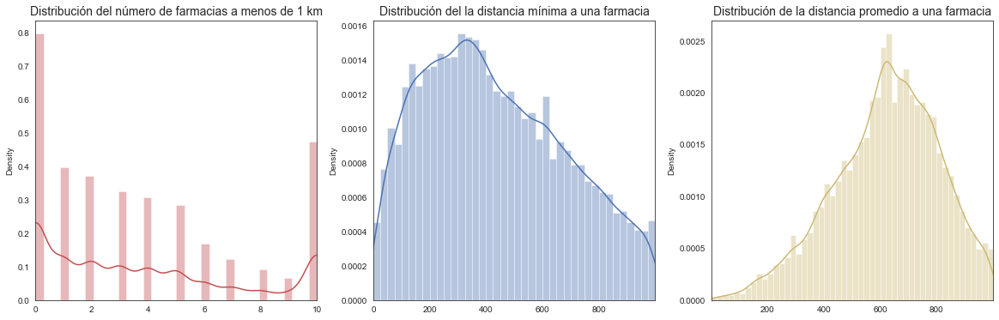

In [11]:
# A DESTACAR

# 1. Distribución de las variables asociadas a las farmacias:
#      - Es visible que la proporción de viviendas en venta es menor a mayor número de farmacias a menos de 1 km, curiosamente
#        la proporción es mayor cuando hay 10 farmacias a menos de 1 km. Cabe preguntarse si esto es un error en los 
#        datos o si estas viviendas se ubican en zonas céntricas donde la proporción de farmacias suele ser mucho mayor.
#      - Por otra parte, la distribución de las variables asociadas a la distancia mínima y promedio a una farmacia muestran
#        un comportamiento más 'normal', siendo la mayor proporción cuando la farmacia se encuentra entre 200 y 400 
#        metros, y cuando la distancia promedio de las farmacias cercanas es de 600 a 800 metros.


fig, ax = plt.subplots(1, 3, figsize=(20,6))

n_farm = var_farm['n_farm'].values
min_dist_farm = var_farm['min_dist_farm'].values
mean_dist_farm = var_farm['mean_dist_farm'].values

sns.distplot(n_farm, ax=ax[0], color='r')
ax[0].set_title('Distribución del número de farmacias a menos de 1 km', fontsize=14)
ax[0].set_xlim([min(n_farm), max(n_farm)])

sns.distplot(min_dist_farm, ax=ax[1], color='b')
ax[1].set_title('Distribución del la distancia mínima a una farmacia', fontsize=14)
ax[1].set_xlim([min(min_dist_farm), max(min_dist_farm)])

sns.distplot(mean_dist_farm, ax=ax[2], color='y')
ax[2].set_title('Distribución de la distancia promedio a una farmacia', fontsize=14)
ax[2].set_xlim([min(mean_dist_farm), max(mean_dist_farm)])

plt.show()

In [12]:
# A DESTACAR

# 1. Es visible que la variable mean_dist_farm tiene outliers por los valores cercanos a 0.

fig = px.box(var_farm, y="mean_dist_farm")

fig.show()


C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



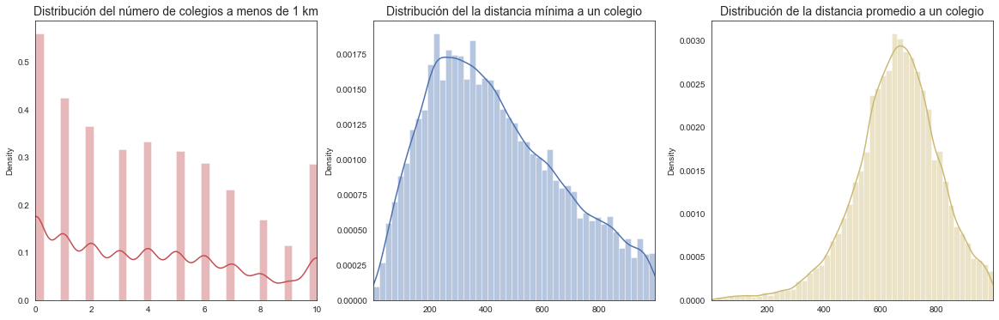

In [13]:
# A DESTACAR

# 1. Distribución de las variables asociadas a las colegios:
#      - Estas 3 variables se comportan de manera muy similar a las asociadas a las farmacias. Desde la perspectiva del 
#        comprador, tiene mucho sentido asignar una importancia similar al número y la distancia de colegios y farmacias
#        en la cercanía.


fig, ax = plt.subplots(1, 3, figsize=(20,6))

n_col = var_col['n_col'].values
min_dist_col = var_col['min_dist_col'].values
mean_dist_col = var_col['mean_dist_col'].values

sns.distplot(n_col, ax=ax[0], color='r')
ax[0].set_title('Distribución del número de colegios a menos de 1 km', fontsize=14)
ax[0].set_xlim([min(n_col), max(n_col)])

sns.distplot(min_dist_col, ax=ax[1], color='b')
ax[1].set_title('Distribución del la distancia mínima a un colegio', fontsize=14)
ax[1].set_xlim([min(min_dist_col), max(min_dist_col)])

sns.distplot(mean_dist_col, ax=ax[2], color='y')
ax[2].set_title('Distribución de la distancia promedio a un colegio', fontsize=14)
ax[2].set_xlim([min(mean_dist_col), max(mean_dist_col)])

plt.show()

In [14]:
# A DESTACAR

# 1. Es visible que la variable mean_dist_col tiene outliers por valores cercanos a 0, parecido a la variable mean_dist_farm.

fig = px.box(var_col, y="mean_dist_col")

fig.show()

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



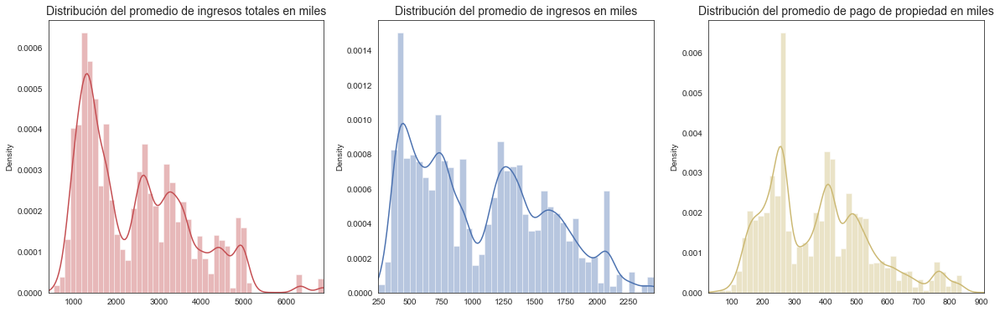

In [15]:
# A DESTACAR

# 1. Distribución de las variables asociadas a promedios:
#      - Se puede observar que estas 3 variables tienen un skewness positivo. Es posible la precensia de outliers en cada una.

df['ingresos_tot_m'] = (var_avg['CNH_INGTOTP'].astype(float)/1000).astype(float) #división por mil para mayor comprensión de las 
df['ingresos_m'] = (var_avg['CNRH_INGOCUP'].astype(float)/1000).astype(float)     #gráficas.
df['arriendo_m'] = (var_avg['CNV_MONPAGVIVP'].astype(float)/1000).astype(float)

# las variables sin transformar se eliminan.

df = df.drop(['CNH_INGTOTP','CNRH_INGOCUP','CNV_MONPAGVIVP'],axis=1)

fig, ax = plt.subplots(1, 3, figsize=(20,6))

avg_ingreso_tot = df['ingresos_tot_m'].values
avg_ingreso = df['ingresos_m'].values
avg_arriendo = df['arriendo_m'].values

sns.distplot(avg_ingreso_tot, ax=ax[0], color='r')
ax[0].set_title('Distribución del promedio de ingresos totales en miles', fontsize=14)
ax[0].set_xlim([min(avg_ingreso_tot), max(avg_ingreso_tot)])

sns.distplot(avg_ingreso, ax=ax[1], color='b')
ax[1].set_title('Distribución del promedio de ingresos en miles', fontsize=14)
ax[1].set_xlim([min(avg_ingreso), max(avg_ingreso)])

sns.distplot(avg_arriendo, ax=ax[2], color='y')
ax[2].set_title('Distribución del promedio de pago de propiedad en miles', fontsize=14)
ax[2].set_xlim([min(avg_arriendo), max(avg_arriendo)])

plt.show()


In [16]:
# A DESTACAR

# 1. Es visible que la variable ingresos_tot_m tiene outliers por los valores mayores a 6 millones de ingresos totales.
# 2. A su vez, la variable arriendo_m tiene outliers por los valores mayores a 850 mil pesos de arriendo.

fig = px.box(df, y="ingresos_tot_m")
fig1 = px.box(df, y="ingresos_m")
fig2 = px.box(df, y="arriendo_m")


fig.show()
fig1.show()
fig2.show()


C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-pac

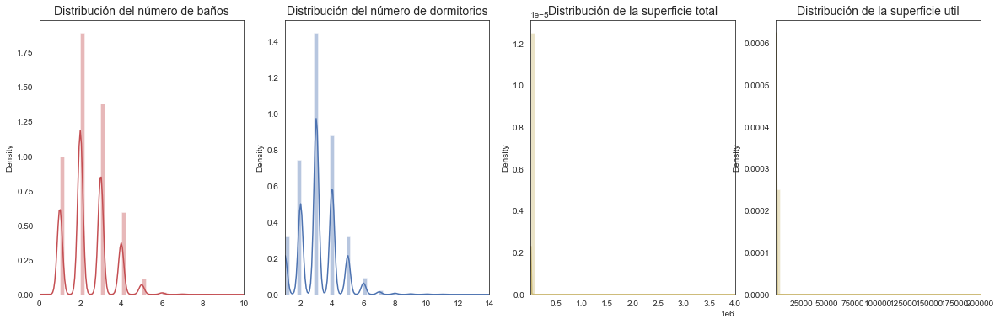

In [17]:
# A DESTACAR

# 1. Distribución de las variables asociadas a la vivienda:
#      - Es evidente que las variables de superficie total y útil tienen outliers con información erronea, la cual será
#        tratada para evitar errores en el modelo de regresión.

fig, ax = plt.subplots(1, 4, figsize=(20,6))

banos = var_viv['banos'].values
dormitorios = var_viv['dormitorios'].values
sup_total = var_viv['sup_total'].values
sup_util = var_viv['sup_util'].values

sns.distplot(banos, ax=ax[0], color='r')
ax[0].set_title('Distribución del número de baños', fontsize=14)
ax[0].set_xlim([min(banos), max(banos)])

sns.distplot(dormitorios, ax=ax[1], color='b')
ax[1].set_title('Distribución del número de dormitorios', fontsize=14)
ax[1].set_xlim([min(dormitorios), max(dormitorios)])

sns.distplot(sup_total, ax=ax[2], color='y')
ax[2].set_title('Distribución de la superficie total', fontsize=14)
ax[2].set_xlim([min(sup_total), max(sup_total)])

sns.distplot(sup_util, ax=ax[3], color='y')
ax[3].set_title('Distribución de la superficie util', fontsize=14)
ax[3].set_xlim([min(sup_util), max(sup_util)])

plt.show()

In [18]:
# A DESTACAR

# 1. Es visible que la variable baños y dormitorios tienen outliers, sin embargo es posible que dichos valores no sean erroneos
#    (ej. viviendas con 6 baños o 6 habitaciones)
# 2. Por otra parte, la variables asociadas a la superficie total y util tienen outliers cuyos valores no son lógicos
#    (ej. viviendas con superficie total de 4 millones)

fig = px.box(df, y="sup_total")
fig1 = px.box(df, y="sup_util")
fig2 = px.box(df, y="banos")
fig3 = px.box(df, y="dormitorios")

fig.show()
fig1.show()
fig2.show()
fig3.show()

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



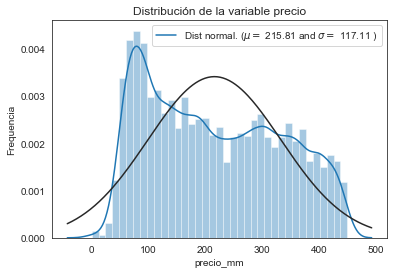

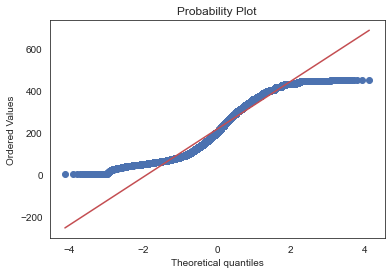

Skewness precio: 0.262026
Kurtosis precio: -1.168198


In [19]:
# A DESTACAR

# 1. La variable de 'precio_mm' muestra una simetría imperfecta, sobre todo por la distribución concentrada en la parte izquierda 
#    de la cola (precios entre 50 y 100 millones)
# 2. Por otra parte, como es visible, la distribución de precios es amplia entre los 50 y los 400 millones de pesos.

df['precio_mm'] = (df['precio_f'].astype(float)/1000000).astype(float) #división por millón para mejor comprensión de la gráfica.

df = df.drop(['precio_f'],axis=1)

sns.distplot(df['precio_mm'] , fit=norm)

(mu, sigma) = norm.fit(df['precio_mm'])

plt.legend(['Dist normal. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequencia')
plt.title('Distribución de la variable precio')

#QQ plot para ver qué tanto se aleja la variable precio de una distribución normal
fig = plt.figure()
res = stats.probplot(df['precio_mm'], plot=plt)
plt.show()


print("Skewness precio: %f" % df['precio_mm'].skew())
print("Kurtosis precio: %f" % df['precio_mm'].kurt())

In [20]:
# TRATAMIENTO DE VALORES NULOS

# A DESTACAR

# 1. Dado que las variables asociadas al promedio de distancia de colegios y farmacias, a la superficie útil, a los baños 
# y a valor del arriendo contiene outliers, es conveniente imputar sus valores nulos por la mediana.

def imputar_nulls_median(data, col):

    median = data[col].median()
    
    data[col] = data[col].fillna(median)

imputar_nulls_median(df,'mean_dist_farm')
imputar_nulls_median(df,'mean_dist_col')
imputar_nulls_median(df,'sup_util')
imputar_nulls_median(df,'banos')
imputar_nulls_median(df,'dormitorios')
imputar_nulls_median(df,'arriendo_m')


In [21]:
# A DESTACAR

# 1. Por otro lado, la distribución de las variables asociadas a las distancias mínimas de colegios y farmacias tiende a 
#    ser normal, por ende conviene imputar los valores nulos por la media.

def imputar_nulls_media(data, col):

    mean = data[col].mean()
    
    # Replace missing values with the column mean
    data[col] = data[col].fillna(mean)

imputar_nulls_media(df,'min_dist_farm')
imputar_nulls_media(df,'min_dist_col')

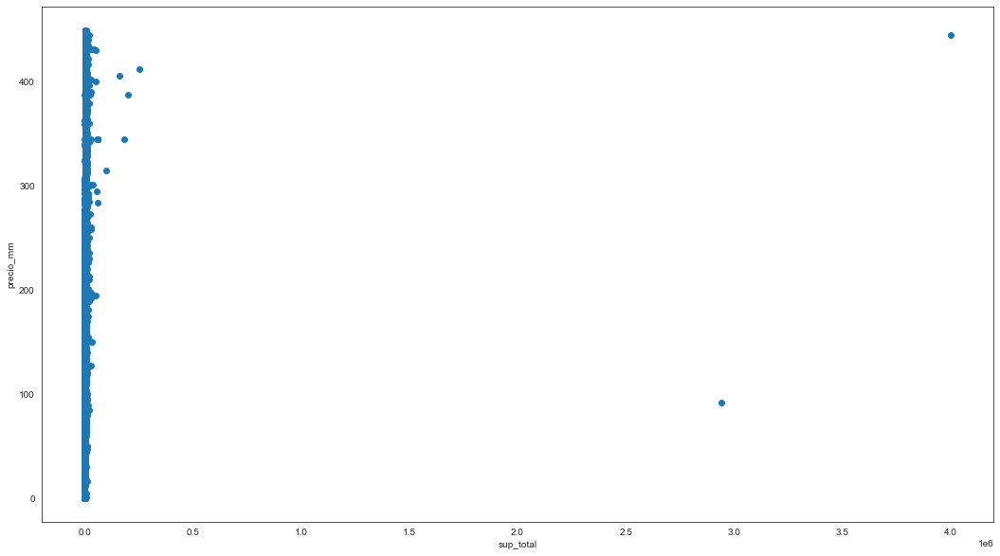

In [23]:
# A DESTACAR

# 1. Se puede observar como, efectivamente, existen valores atípicos tanto en la variables sup_total como en sup_util. 

# Scatter plot sup_total

fig, ax = plt.subplots(figsize = (18,10))
ax.scatter(df['sup_total'], df['precio_mm'])
 
ax.set_xlabel('sup_total')

ax.set_ylabel('precio_mm')
plt.show()
 

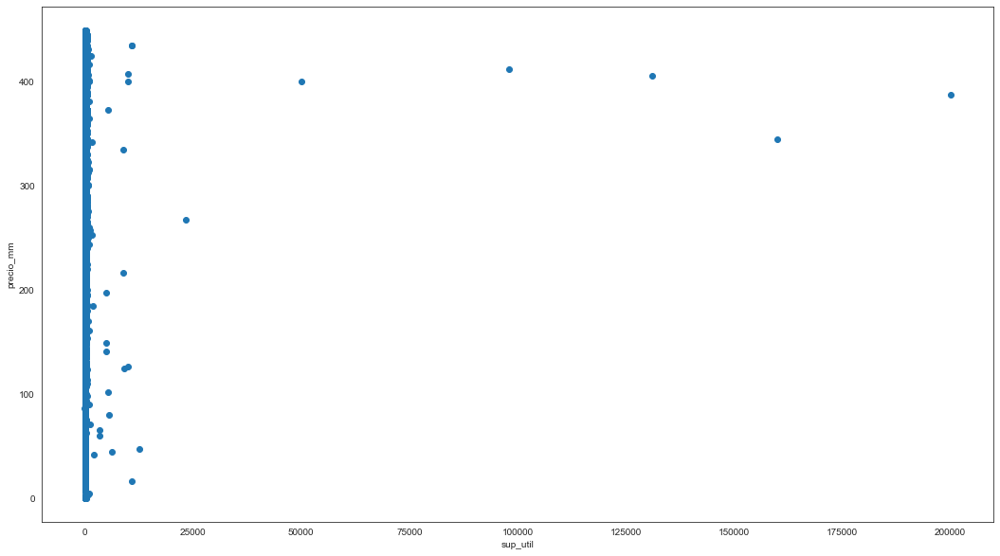

In [24]:
# Scatter plot sup_util

fig, ax = plt.subplots(figsize = (18,10))
ax.scatter(df['sup_util'], df['precio_mm'])
 
ax.set_xlabel('sup_util')

ax.set_ylabel('precio_mm')
plt.show()
 

In [26]:
# A DESTACAR

# 1. Analizando los datos de estas 2 variables, se puede deducir que los valores mayores a 600 m2 de superficie útil tienen alta
#    probabilidad de ser errores; así como los mayores a 6000 m2 de superficie total. Por ende estos son removidos.

df.drop(df[df['sup_util'] > 600].index, inplace=True)
df.drop(df[df['sup_total'] > 6000].index, inplace=True)

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



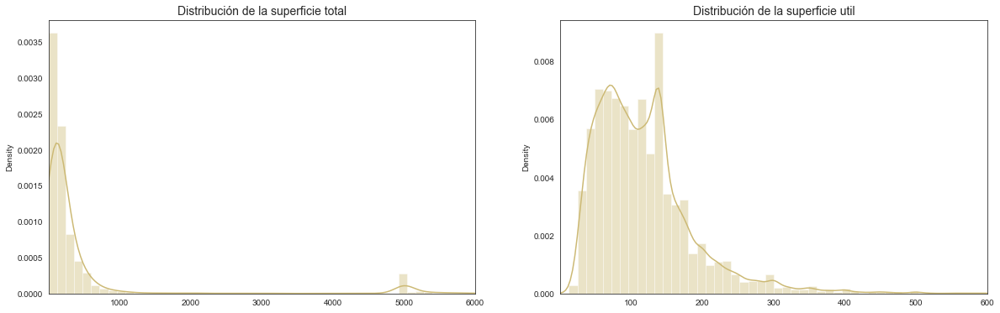

sup_util                                                         
        count        mean        std   min    25%    50%    75%    max
tipo                                                                  
1     20330.0   87.480423  42.328511  12.0   54.0   80.0  120.0  556.0
2     17029.0  154.567972  77.122527   1.0  100.0  140.0  186.0  600.0

In [27]:
# A DESTACAR

# 1. Distribución de las variables asociadas a la vivienda removiendo principales outliers:
#      - Se puede observar que los datos tienen más sentido ahora. El skewess hacia la derecha en ambas gráficas
#        se debe a la precencia de outliers, en teoría, ligítimos.
# 2. Cabe destacar que la superficie total y útil difiere en casas y deptos, y que aún pueden existir outliers atípicos en 
#    los datos.

fig, ax = plt.subplots(1, 2, figsize=(20,6))

sup_total = df['sup_total'].values
sup_util = df['sup_util'].values

sns.distplot(sup_total, ax=ax[0], color='y')
ax[0].set_title('Distribución de la superficie total', fontsize=14)
ax[0].set_xlim([min(sup_total), max(sup_total)])

sns.distplot(sup_util, ax=ax[1], color='y')
ax[1].set_title('Distribución de la superficie util', fontsize=14)
ax[1].set_xlim([min(sup_util), max(sup_util)])

plt.show()

# superficie útil por tipo (casa y depto)

data_sup = df[['sup_util','tipo']]

data_sup_agr = data_sup.groupby(['tipo'])
data_sup_agr.describe()


In [32]:
# A DESTACAR

# 1. Tendiendo en cuenta el pre-procesamiento anterior, se puede ver que las variables numéricas con mayor grado
#    de desviación normal son las asociadas a la superficie total y útil. Para reducir el impacto de los outliers de estas
#    columnas se aplica una transformación logarítmica.

numeric_feats = df.dtypes[df.dtypes != "object"].index

# Check the skew of all numerical features
skewed_feats = df[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
skewness = pd.DataFrame({'Skew' :skewed_feats})

# Transformación logarítmica sobre las variables cuyo skewness sea mayor al 0.9

skewed_feats = skewed_feats[skewed_feats > 0.9]
skewed_feats = skewed_feats.index

df[skewed_feats] = np.log1p(df[skewed_feats])


In [34]:
# A DESTACAR

# 1. Si el porcentaje de Skew sigue siendo mayor a .9, correr nuevamente el código anterior

skewness.head(10)

,Skew
RH_PERLLEG4,0.896122
ingresos_tot_m,0.753305
arriendo_m,0.641354
banos,0.639452
n_farm,0.635063
min_dist_col,0.531230
sup_total,0.434899
n_col,0.416181
ingresos_m,0.412059
min_dist_farm,0.404522


<AxesSubplot:>

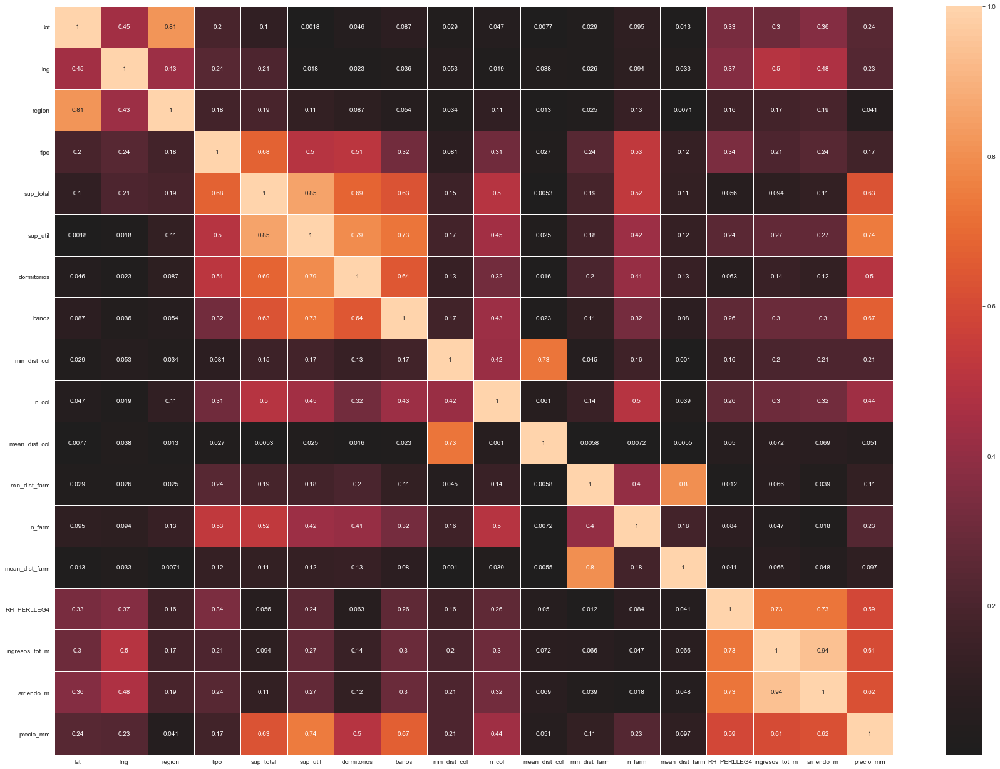

In [35]:
# A DESTACAR

# 1. Las variables con mayor correlación con el precio de la vivienda son superficie útil, ingresos y arriendo.
#    Por otra parte, existen variables con alta correlación que podrían añadir ruido al modelo a desarrollar. Por ejemplo,
#    el promedio de ingresos totales de la zona y el promedio de ingresos. En este caso solo se tendrá en cuenta los ingresos 
#    totales.

df = df.drop(['ingresos_m'],axis=1)

fig, ax = plt.subplots(figsize=(30,22))
corr_matrix = df.corr().abs()
sns.heatmap(corr_matrix, annot=True, linewidths=.5, ax=ax,center=0)

In [36]:
# Variable más importantes teniendo en cuenta su grado de correlación con respecto a la variable objetivo.

print("Variables con mayor correlación con respecto a la variable objetivo")
corr_matrix = df.corr()
corr_matrix["precio_mm"].sort_values(ascending=False)

Variables con mayor correlación con respecto a la variable objetivo


precio_mm         1.000000
sup_util          0.742771
banos             0.670469
sup_total         0.629566
arriendo_m        0.619776
ingresos_tot_m    0.608375
RH_PERLLEG4       0.590428
dormitorios       0.498570
lat               0.239539
lng               0.232185
min_dist_col      0.208870
tipo              0.169892
min_dist_farm     0.112807
mean_dist_farm    0.096682
mean_dist_col     0.050578
region            0.041340
n_farm           -0.231955
n_col            -0.437913
Name: precio_mm, dtype: float64

## 3. Definición muestra

Definición de acuerdo lo inspeccionado anteriormente cual será su muestra final posterior a los filtros pertinentes y a su estrategia de validación que se utilizará para el modelo a estimar.

In [37]:
# A DESTACAR

# 1. Una vez hecho el EDA y el pre-procesamiento previo, se tendrán en cuenta 18 variables independientes para predecir 
#    el precio de la vivienda.
# 2. Dado que el objetivo es predecir una variable objetivo numérica, se llevará a cabo un modelo de regresión lineal con 
#    sus respectivos ajustes de regularización Lasso, Ridge, ElasticNet; con el fin de reducir la complejidad del modelo, y 
#    comparando sus respectivos scores de entrenamiento y testeo para medir su efectividad, aplicando validaciones cruzadas
#    y optimizando el hiperparámetro alpha.
# 3. por otra parte, se usará un modelo de Random Forest para medir el poder predictivo usando algoritmos basados en árboles
#    más complejos, y haciendo uso de la carácterista de "feature importance" para identificar los variables más relevantes
#    del modelo.
     

df_ = df[['precio_mm','sup_util','banos','arriendo_m','sup_total','ingresos_tot_m','RH_PERLLEG4','dormitorios','lat','lng',
          'min_dist_col','tipo','min_dist_farm','mean_dist_farm','mean_dist_col','region','n_farm','n_col']]

In [38]:
X=df_.drop('precio_mm', axis=1)
y=df_['precio_mm']

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)


In [40]:
# Estandarización de variables numéricas

numerical_features = X.select_dtypes(exclude = ["object"]).columns

stdSc = StandardScaler()
X_train.loc[:, numerical_features] = stdSc.fit_transform(X_train.loc[:, numerical_features])
X_test.loc[:, numerical_features] = stdSc.transform(X_test.loc[:, numerical_features])

## 4. Estimación de modelo

Elección de la metodología de modelamiento y su razón. Estimar el modelo 

In [41]:
# ESTIMACIÓN DE MODELOS

model = LinearRegression()

model.fit(X_train, y_train)
model.fit(X_test, y_test)


LinearRegression()

In [42]:
print('Score de entrenamiento:',model.score(X_train, y_train))
print('Score de testeo:',model.score(X_test, y_test))

Score de entrenamiento: 0.815986686385163
Score de testeo: 0.8179834694977115


In [43]:
pd.DataFrame(model.coef_, X.columns, columns=['Coeficients'])

,Coeficients
sup_util,31.288880
banos,21.699921
arriendo_m,3.658168
sup_total,49.911109
ingresos_tot_m,25.091701
RH_PERLLEG4,23.765104
dormitorios,-11.535407
lat,18.247001
lng,7.899079
min_dist_col,1.863066


In [44]:
y_pred = model.predict(X_test)

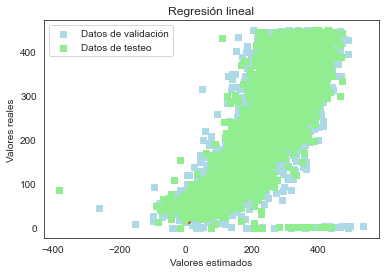

In [46]:
# A DESTACAR

# 1. los errores parecen distribuidos aleatoriamente sobre la linea central, a excepción de algunos casos más distantes, 
#    que representan el grado de error del modelo. 

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Plot predictions
plt.scatter(y_train_pred, y_train, c = "lightblue", marker = "s", label = "Datos de validación")
plt.scatter(y_test_pred, y_test, c = "lightgreen", marker = "s", label = "Datos de testeo")
plt.title("Regresión lineal")
plt.xlabel("Valores estimados")
plt.ylabel("Valores reales")
plt.legend(loc = "upper left")
plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()

In [47]:

# Funciones para regresar el RMSE del modelo, con una validación cruzada de 10.

scorer = make_scorer(mean_squared_error, greater_is_better = False)

def rmse_cv_train(model):
    rmse= np.sqrt(-cross_val_score(model, X_train, y_train, scoring = scorer, cv = 10))
    return(rmse)

def rmse_cv_test(model):
    rmse= np.sqrt(-cross_val_score(model, X_test, y_test, scoring = scorer, cv = 10))
    return(rmse)

Mejor alpha : 18.0
RMSE de Ridge en el set de entrenamiento : 49.960579250863226
RMSE de Ridge en el set de testeo : 50.320830131566964


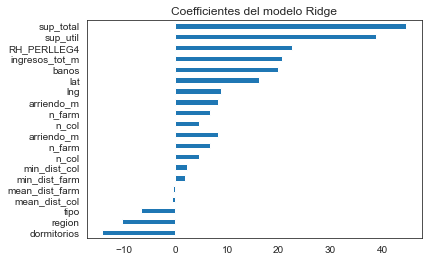

In [48]:
# A DESTACAR

# 1. El alpha sugerido para el modelo con regularización Ridge es de 14.

ridge = RidgeCV(alphas = [0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 3, 6, 10, 30, 60])
ridge.fit(X_train, y_train)
alpha = ridge.alpha_

ridge = RidgeCV(alphas = [alpha * .6, alpha * .65, alpha * .7, alpha * .75, alpha * .8, alpha * .85, 
                          alpha * .9, alpha * .95, alpha, alpha * 1.05, alpha * 1.1, alpha * 1.15,
                          alpha * 1.25, alpha * 1.3, alpha * 1.35, alpha * 1.4], 
                cv = 10)
ridge.fit(X_train, y_train)
alpha = ridge.alpha_

print("Mejor alpha :", alpha)
print("RMSE de Ridge en el set de entrenamiento :", rmse_cv_train(ridge).mean())
print("RMSE de Ridge en el set de testeo :", rmse_cv_test(ridge).mean())
y_train_rdg = ridge.predict(X_train)
y_test_rdg = ridge.predict(X_test)

# Plot important coefficients
coefs = pd.Series(ridge.coef_, index = X_train.columns)
imp_coefs = pd.concat([coefs.sort_values().head(10),
                     coefs.sort_values().tail(10)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficientes del modelo Ridge")
plt.show()

Mejor alpha : 0.00081
RMSE de Lasso en el set de entrenamiento : 49.960661365465114
RMSE de Lasso en el set de testeo : 50.32416305045308


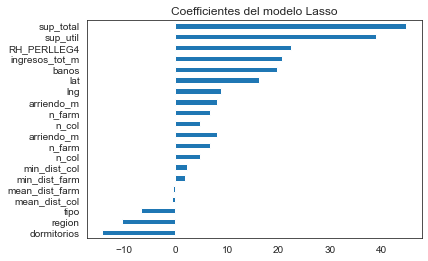

In [49]:
# A DESTACAR

# 1. El alpha sugerido para el modelo con regularización Lasso es de 0.00085.

lasso = LassoCV(alphas = [0.0001, 0.0003, 0.0006, 0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 
                          0.3, 0.6, 1], 
                max_iter = 50000, cv = 10)
lasso.fit(X_train, y_train)
alpha = lasso.alpha_
lasso = LassoCV(alphas = [alpha * .6, alpha * .65, alpha * .7, alpha * .75, alpha * .8, 
                          alpha * .85, alpha * .9, alpha * .95, alpha, alpha * 1.05, 
                          alpha * 1.1, alpha * 1.15, alpha * 1.25, alpha * 1.3, alpha * 1.35, 
                          alpha * 1.4], 
                max_iter = 50000, cv = 10)
lasso.fit(X_train, y_train)
alpha = lasso.alpha_
print("Mejor alpha :", alpha)
print("RMSE de Lasso en el set de entrenamiento :", rmse_cv_train(lasso).mean())
print("RMSE de Lasso en el set de testeo :", rmse_cv_test(lasso).mean())
y_train_las = lasso.predict(X_train)
y_test_las = lasso.predict(X_test)

# Coefficientes del modelo en orden de imporancia

coefs = pd.Series(lasso.coef_, index = X_train.columns)
imp_coefs = pd.concat([coefs.sort_values().head(10),
                     coefs.sort_values().tail(10)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficientes del modelo Lasso")
plt.show()

Best l1_ratio : 0.3
Best alpha : 0.001
Intentar nuevamente para mayor precisión 0.3
Mejor l1_ratio : 0.255
Mejor alpha : 0.001
Mejor l1_ratio : 0.255
Mejor alpha : 0.001
RMSE de elasticNet el set de entrenamiento : 49.96066300741901
RMSE de elasticNet en el set de testeo : 50.32240069678539


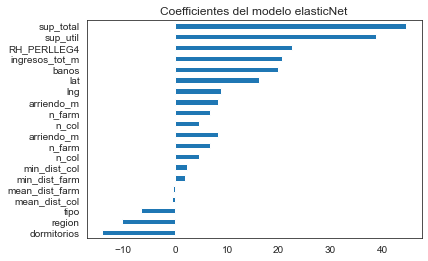

In [50]:
# A DESTACAR

# 1. El alpha sugerido para el modelo con regularización elasticNet es de 0.00095

elasticNet = ElasticNetCV(l1_ratio = [0.1, 0.3, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 1],
                          alphas = [0.0001, 0.0003, 0.0006, 0.001, 0.003, 0.006, 
                                    0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 3, 6], 
                          max_iter = 50000, cv = 10)
elasticNet.fit(X_train, y_train)
alpha = elasticNet.alpha_
ratio = elasticNet.l1_ratio_
print("Best l1_ratio :", ratio)
print("Best alpha :", alpha )

print("Intentar nuevamente para mayor precisión " + str(ratio))
elasticNet = ElasticNetCV(l1_ratio = [ratio * .85, ratio * .9, ratio * .95, ratio, ratio * 1.05, ratio * 1.1, ratio * 1.15],
                          alphas = [0.0001, 0.0003, 0.0006, 0.001, 0.003, 0.006, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 3, 6], 
                          max_iter = 50000, cv = 10)
elasticNet.fit(X_train, y_train)
if (elasticNet.l1_ratio_ > 1):
    elasticNet.l1_ratio_ = 1    
alpha = elasticNet.alpha_
ratio = elasticNet.l1_ratio_
print("Mejor l1_ratio :", ratio)
print("Mejor alpha :", alpha )

elasticNet = ElasticNetCV(l1_ratio = ratio,
                          alphas = [alpha * .6, alpha * .65, alpha * .7, alpha * .75, alpha * .8, alpha * .85, alpha * .9, 
                                    alpha * .95, alpha, alpha * 1.05, alpha * 1.1, alpha * 1.15, alpha * 1.25, alpha * 1.3, 
                                    alpha * 1.35, alpha * 1.4], 
                          max_iter = 50000, cv = 10)
elasticNet.fit(X_train, y_train)
if (elasticNet.l1_ratio_ > 1):
    elasticNet.l1_ratio_ = 1    
alpha = elasticNet.alpha_
ratio = elasticNet.l1_ratio_
print("Mejor l1_ratio :", ratio)
print("Mejor alpha :", alpha )

print("RMSE de elasticNet el set de entrenamiento :", rmse_cv_train(elasticNet).mean())
print("RMSE de elasticNet en el set de testeo :", rmse_cv_test(elasticNet).mean())
y_train_ela = elasticNet.predict(X_train)
y_test_ela = elasticNet.predict(X_test)

# Coefficientes del modelo en orden de importancia

coefs = pd.Series(elasticNet.coef_, index = X_train.columns)
imp_coefs = pd.concat([coefs.sort_values().head(10),
                     coefs.sort_values().tail(10)])
imp_coefs.plot(kind = "barh")
plt.title("Coefficientes del modelo elasticNet")
plt.show()

## 5. Evaluación del modelo

Elección de las métricas a utilizar para evaluar el rendimiento del modelo asi como la justificación de la elección de métricas utilizadas.

In [53]:
# A DESTACAR

# 1. A continuación se usan los mejores hyperparámetros alpha para cada regularización, junto al modelo de regresión lineal
#    y random forest

# Regresión lineal

lr = LinearRegression()
model= lr.fit(X_train, y_train)

# Regularización Lasso

lasso = Lasso(alpha=0.00085)
lasso.fit(X_train, y_train)

# Regularización Ridge

ridge = Ridge(alpha=14) 
ridge.fit(X_train, y_train)

# Regularización ElasticNet

elastic=ElasticNet(0.00095)
elastic = elastic.fit(X_train, y_train)

# Random Forest

randomF = RandomForestRegressor(max_depth=50)
randomF.fit(X_train, y_train)


RandomForestRegressor(max_depth=50)

In [54]:
# Se guardan los resultados en una lista

list_of_Scores = list()

# Regresión lineal
results = {'Model':'LinearRegression',
           'Train Score': model.score(X_train, y_train),
           'Test Score':model.score(X_test, y_test),
           }
list_of_Scores.append(results)

# Lasso
results = {'Model':'Lasso',
           'Train Score':lasso.score(X_train, y_train),
           'Test Score': lasso.score(X_test, y_test),
           }
list_of_Scores.append(results)

# Ridge
results = {'Model':'Ridge',
           'Train Score': ridge.score(X_train, y_train),
           'Test Score':ridge.score(X_test, y_test),
           }
list_of_Scores.append(results)

# ElasticNet
results = {'Model':'ElasticNet',
           'Train Score': elastic.score(X_train, y_train),
           'Test Score':elastic.score(X_test, y_test),
           }
list_of_Scores.append(results)

# Random Forest
results = {'Model':'RandomForest',
           'Train Score':randomF.score(X_train, y_train),
           'Test Score':randomF.score(X_test, y_test),
           }
list_of_Scores.append(results) 

In [55]:
# A DESTACAR

# 1. El R2 es similar entre la regresión lineal y las regularizaciones (0.825 aprox, lo que indica que el 82.5% de la varianza
#    en el precio de oferta de las vivienda puede der explicado en mayor medida por los predictores descritos anteriormente) 
# 2. Los valores de train y de test son similares por lo que el modelo está bien ajustado y las predicciones son
#    en mayor medida generalizables.
# 3. El modelo con mayor poder predictivo es Random Forest.

df_results = pd.DataFrame(list_of_Scores)
df_results

,Model,Train Score,Test Score
0,LinearRegression,0.817212,0.816655
1,Lasso,0.817212,0.816654
2,Ridge,0.817212,0.816650
3,ElasticNet,0.817212,0.816650
4,RandomForest,0.988789,0.919467


In [56]:
# A DESTACAR

# 1. 4 variables suman casi 90% de importancia:
#        1. Superficie útil
#        2. RH_PERLLEG4 (% de personas en la zona de la propiedad que si nació en otro país, llegó antes de 1990)
#        3. Arriendo_m (Promedio Monto de pago por concepto de arriendo o dividendo en la zona de la propiedad)
#        4. Superficie total
# 2. Dichas variables tienen sentido a la hora de predecir el precio de oferta de la vivienda, por un lado, con las variables
#    de superficie (cuya correlación con la variable objetivo es positiva) se puede intuir que a mayor área mayor es el precio
#    de oferta. Así mismo, el valor del arriendo promedio de la zona de la propiedad es un buen indicador del precio de la 
#    vivienda, por ejemplo, en una zona cuyas carácteristicas socioeconómicas sean altas es más probable que el precio de la
#    vivienda sea elevado. Por otro lugar, el porcentaje de personas extranjeras en la zona puede ser un indicador de
#    carácteristicas socioeconómicas especiales que influyen en la variable objetivo.

feature_importances = pd.DataFrame(randomF.feature_importances_, index =X.columns,  
                                   columns=['importance']).sort_values('importance', ascending=False)
feature_importances


,importance
sup_util,0.550501
RH_PERLLEG4,0.122688
arriendo_m,0.122543
sup_total,0.086621
lat,0.032568
lng,0.022246
ingresos_tot_m,0.016153
banos,0.010485
min_dist_col,0.006241
min_dist_farm,0.005780


In [57]:
# A DESTACAR 

# 1. Dado que el objetivo es predecir el precio de oferta de la vivienda en función de las variables predictoras, la métrica 
#    de evaluación principal es el coeficiente de determinación R2. La precisión de los modelos (> 80%) dan un buen margen 
#    de predicción.
# 2. Como se observó en mayor medida en el gráfico de predicciones, existían algunos puntos atípicos apartados de la linea 
#    de regresión óptima, por consiguiente, la distancia promedio entre los datos observados y los estimados reflejan un 
#    RMSE alto.

R_square = model.score(X_test,y_test)
MSE=metrics.mean_squared_error(y_test, y_pred)
RMSE= np.sqrt(MSE)

print('R cuadrado :',R_square)
print('RMSE :',RMSE)



R cuadrado : 0.8166547082043955
RMSE : 50.153337562281486


C:\Users\camil\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\camil\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



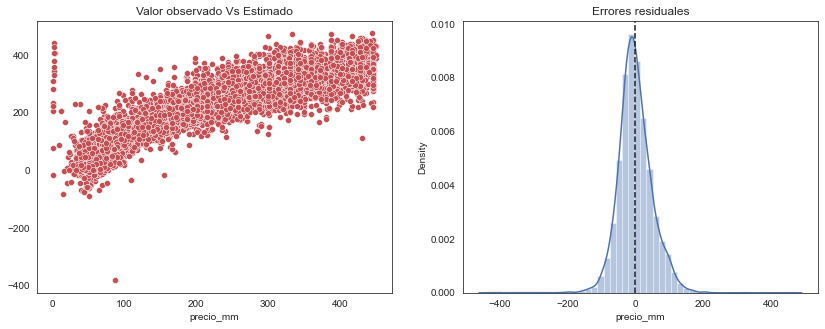

In [58]:
# Linearidad entre valores observados y estimados
f = plt.figure(figsize=(14,5))
ax = f.add_subplot(121)
sns.scatterplot(y_test,y_pred,ax=ax,color='r')
ax.set_title('Valor observado Vs Estimado')

# Verificar normalidad en los errores residuales
ax = f.add_subplot(122)
sns.distplot((y_test - y_pred),ax=ax,color='b')
ax.axvline((y_test - y_pred).mean(),color='k',linestyle='--')
ax.set_title('Errores residuales');

## 6. Reflexiones finales

Reflexiones finales respecto al proceso de modelamiento, potenciales mejoras, bases adicionales interesantes que se podrían ocupar para generar nuevas variables, etc.

In [ ]:
# En el modelo que se construyó, a partir de un pre-procesamiento previo, predice en buena medida el precio de oferta de las 
# viviendas. Sin embargo, con mayor tiempo, se puede indagar la causa de los valores atípicos en la predicción de los datos;
# ya sea imputando variables con outliers, normalizando la variable objetivo, etc. para luego comprobar su impacto en las
# métricas de evaluación; a su vez, se podría hacer mayor énfasis en la interpretación de los coeficientes del modelo.

# Cabe notar que variables como 'antiguedad', que fue eliminada por contar con una gran proporción 
# de valores nulos, pudieron haber contribuido al modelo predictivo; Ya sea por errores en la digitación del dato o por ausencia
# de información, es importante contar con la menor cantidad de nulos en variables con potencial predictivo, o quizá incorporar
# otras como 'balcón (si - no)' (detalles en los que uno se fija a la hora de pagar un arriendo, y que pueden influenciar
# un precio bajo o alto) podría dar mayor peso a la predicción.

# También sería interesante hacer ingeniería con las variables de posicionamiento lat y lng, para construir nuevas
# variables que permitan identificar las zonas geográficas de forma menos compleja.

# Por otra parte, se podría hacer uso de información segundaria para traer carácteristicas demográficas que podrían 
# influenciar el precio de oferta de la vivienda.
